In [1]:
import numpy as np

from ax.modelbridge.cross_validation import cross_validate
from ax.plot.contour import interact_contour
from ax.plot.diagnostic import interact_cross_validation
from ax.plot.scatter import interact_fitted, plot_objective_vs_constraints, tile_fitted
from ax.plot.slice import plot_slice
from ax.service.ax_client import AxClient, ObjectiveProperties
from ax.utils.measurement.synthetic_functions import hartmann6
from ax.utils.notebook.plotting import init_notebook_plotting, render

init_notebook_plotting()

[INFO 03-01 16:46:50] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.
[INFO 03-01 16:46:50] ax.utils.notebook.plotting: Please see
    (https://ax.dev/tutorials/visualizations.html#Fix-for-plots-that-are-not-rendering)
    if visualizations are not rendering.


In [2]:
noise_sd = 0.1
param_names = [f"x{i+1}" for i in range(6)]  # x1, x2, ..., x6

def noisy_hartmann_evaluation_function(parameterization):
    x = np.array([parameterization.get(p_name) for p_name in param_names])
    noise1, noise2 = np.random.normal(0, noise_sd, 2)

    return {
        "hartmann6": (hartmann6(x) + noise1, noise_sd),
        "l2norm": (np.sqrt((x**2).sum()) + noise2, noise_sd),
    }

In [3]:
ax_client = AxClient()
ax_client.create_experiment(
    name="test_visualizations",
    parameters=[
        {
            "name": p_name,
            "type": "range",
            "bounds": [0.0, 1.0],
        }
        for p_name in param_names
    ],
    objectives={"hartmann6": ObjectiveProperties(minimize=True)},
    outcome_constraints=["l2norm <= 1.25"],
)

[INFO 03-01 16:47:54] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 03-01 16:47:54] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter x1. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 03-01 16:47:54] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter x2. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 03-01 16:47:54] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter x3. If that is not the expected value type, you can explicitly specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 03-01 16:47:54] ax.service.

In [4]:
for i in range(20):
    parameters, trial_index = ax_client.get_next_trial()
    # Local evaluation here can be replaced with deployment to external system.
    ax_client.complete_trial(
        trial_index=trial_index, raw_data=noisy_hartmann_evaluation_function(parameters)
    )

[INFO 03-01 16:48:08] ax.service.ax_client: Generated new trial 0 with parameters {'x1': 0.148036, 'x2': 0.104492, 'x3': 0.571045, 'x4': 0.970573, 'x5': 0.541257, 'x6': 0.093269}.
[INFO 03-01 16:48:08] ax.service.ax_client: Completed trial 0 with data: {'hartmann6': (0.051335, 0.1), 'l2norm': (1.406198, 0.1)}.
[INFO 03-01 16:48:08] ax.service.ax_client: Generated new trial 1 with parameters {'x1': 0.227195, 'x2': 0.464516, 'x3': 0.318376, 'x4': 0.264363, 'x5': 0.080896, 'x6': 0.489667}.
[INFO 03-01 16:48:08] ax.service.ax_client: Completed trial 1 with data: {'hartmann6': (-0.842775, 0.1), 'l2norm': (0.742424, 0.1)}.
[INFO 03-01 16:48:08] ax.service.ax_client: Generated new trial 2 with parameters {'x1': 0.549884, 'x2': 0.63935, 'x3': 0.893129, 'x4': 0.222503, 'x5': 0.394977, 'x6': 0.130582}.
[INFO 03-01 16:48:08] ax.service.ax_client: Completed trial 2 with data: {'hartmann6': (-0.480722, 0.1), 'l2norm': (1.4475, 0.1)}.
[INFO 03-01 16:48:08] ax.service.ax_client: Generated new trial 3

[INFO 03-01 16:48:52] ax.service.ax_client: Retrieving contour plot with parameter 'x1' on X-axis and 'x2' on Y-axis, for metric 'hartmann6'. Remaining parameters are affixed to the middle of their range.


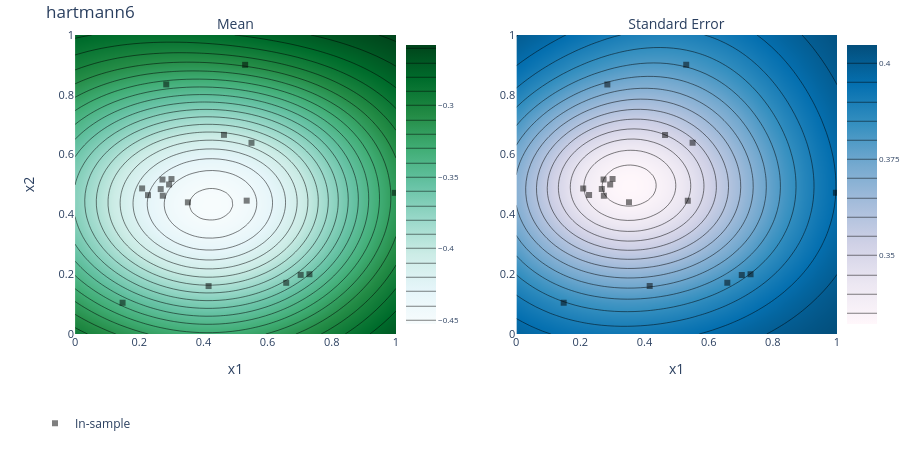

In [5]:
render(ax_client.get_contour_plot(param_x="x1", param_y="x2", metric_name="hartmann6"))

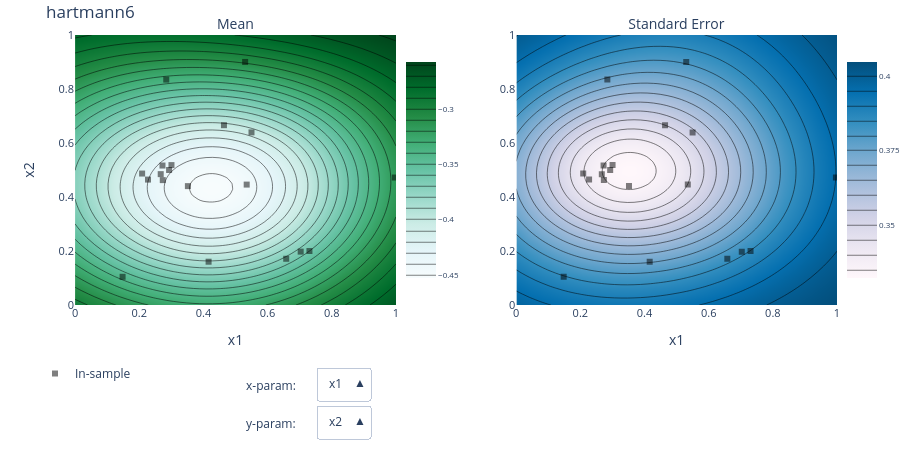

In [6]:
model = ax_client.generation_strategy.model
render(interact_contour(model=model, metric_name="hartmann6"))

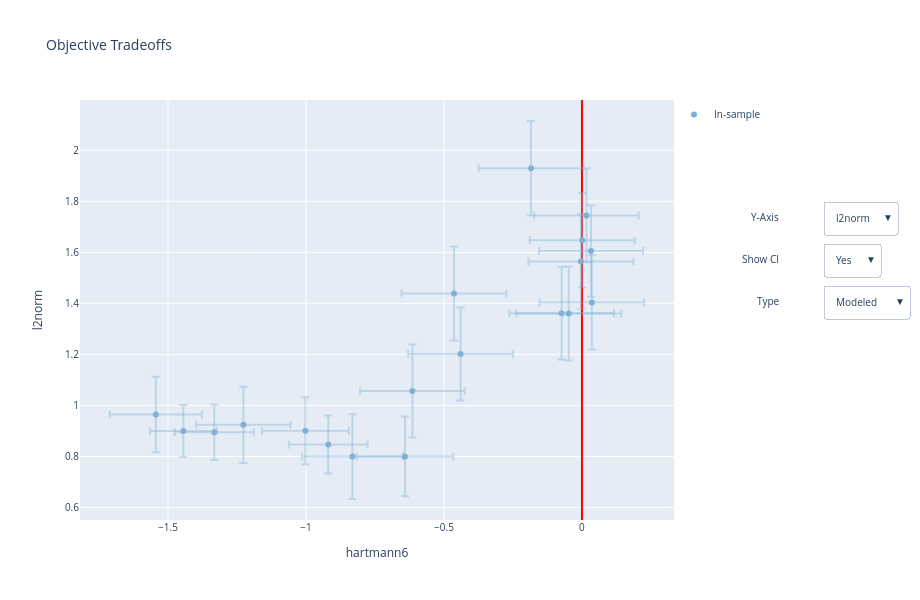

In [7]:
render(plot_objective_vs_constraints(model, "hartmann6", rel=False))

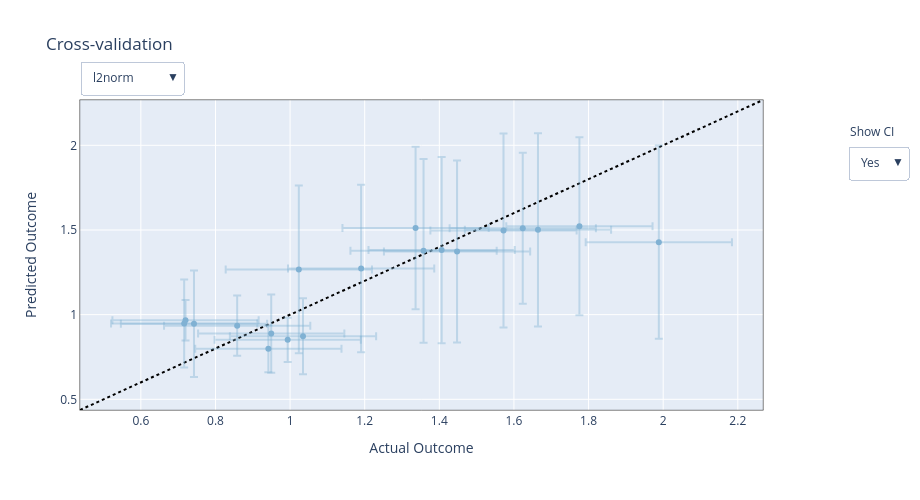

In [8]:
cv_results = cross_validate(model)
render(interact_cross_validation(cv_results))

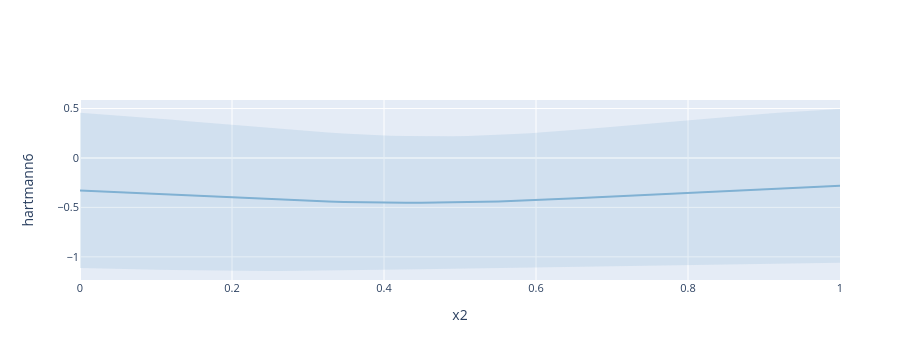

In [9]:
render(plot_slice(model, "x2", "hartmann6"))

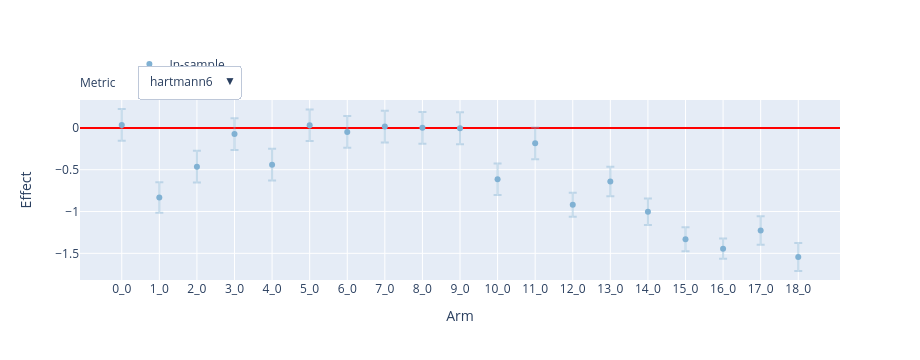

In [10]:
render(interact_fitted(model, rel=False))

In [12]:
ax_client.get_best_parameters()

({'x1': 0.3516005178247184,
  'x2': 0.44030345240340135,
  'x3': 0.09106936788918651,
  'x4': 0.23083801692177155,
  'x5': 0.25371901956120524,
  'x6': 0.5656847815166026},
 ({'l2norm': 0.938327265876367, 'hartmann6': -1.505736381629423},
  {'l2norm': {'l2norm': 0.004023169542321959, 'hartmann6': 0.0},
   'hartmann6': {'l2norm': 0.0, 'hartmann6': 0.006446004803498561}}))